In [6]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

# Per leggere/confrontare velocemente le immagini
def plot_rgb_distribution(images):
    num_imgs = len(images)
    plt.figure(figsize=(30,20))
    for i, image in enumerate(images) :
        
        # image = cv2.imread(path)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Converti da BGR a RGB

        # Show the image
        plt.subplot(2, num_imgs, i+1)
        plt.imshow(image)

        # Extract 2-D arrays of the RGB channels: red, green, blue
        red, green, blue = image[:,:,0], image[:,:,1], image[:,:,2]

        # Flatten the 2-D arrays of the RGB channels into 1-D
        red_pixels = red.flatten() / 255.0  # Normalizza i valori nel range [0, 1]
        green_pixels = green.flatten() / 255.0
        blue_pixels = blue.flatten() / 255.0

        # Calcola l'istogramma dei pixel per ogni canale
        red_px = np.histogram(red_pixels, bins=256, range=[0, 1])
        green_px = np.histogram(green_pixels, bins=256, range=[0, 1])
        blue_px = np.histogram(blue_pixels, bins=256, range=[0, 1])

        # Plot degli istogrammi
        plt.subplot(2,num_imgs,i+1+num_imgs)
        plt.plot(red_px[1][:256], red_px[0], color='r')
        plt.plot(green_px[1][:256], green_px[0], color='g')
        plt.plot(blue_px[1][:256], blue_px[0], color='b')
        plt.xticks(ticks=np.linspace(0, 1, 17), labels=range(0, 257, 16))
        plt.yscale('log')

    plt.show()


52.32678071282254 0.8962607559580249


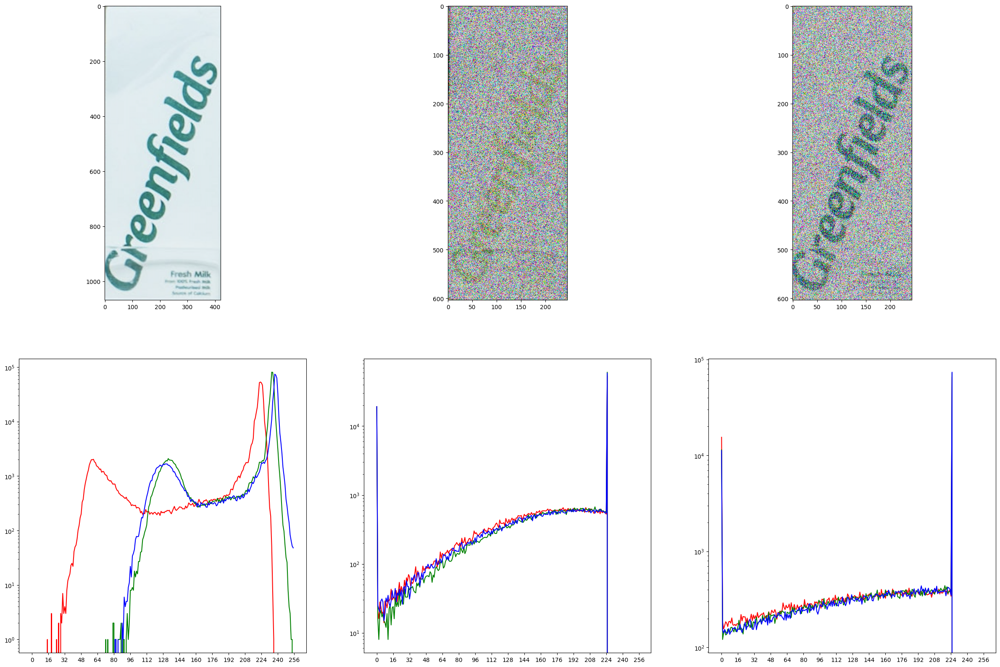

In [7]:
img_no_noise=cv2.imread(f'/Users/pelle/Desktop/dataset/models/ref{26}.png')[:,:,::-1]
img_scene=cv2.imread(f'/Users/pelle/Desktop/dataset/scenes/scene{12}.png')[100:,1085:1330,::-1]
img_noise=cv2.imread(f'/Users/pelle/Desktop/dataset/models/ref{26}.png')[:,:,::-1]
img_noise=cv2.resize(img_noise,(img_scene.shape[1],img_scene.shape[0]),interpolation= cv2.INTER_LINEAR)
noise = np.random.normal(scale=150, size=img_noise.shape)
img_noise=np.clip(img_noise-noise,0,225).astype(np.uint8)
print(np.abs(np.mean(img_scene)-np.mean(img_no_noise)),np.abs(np.mean(img_scene)-np.mean(img_noise)))
plot_rgb_distribution([img_no_noise]+
                        [img_scene]+
                        [img_noise]
                      )

57.841618393312075 4.319031851151067


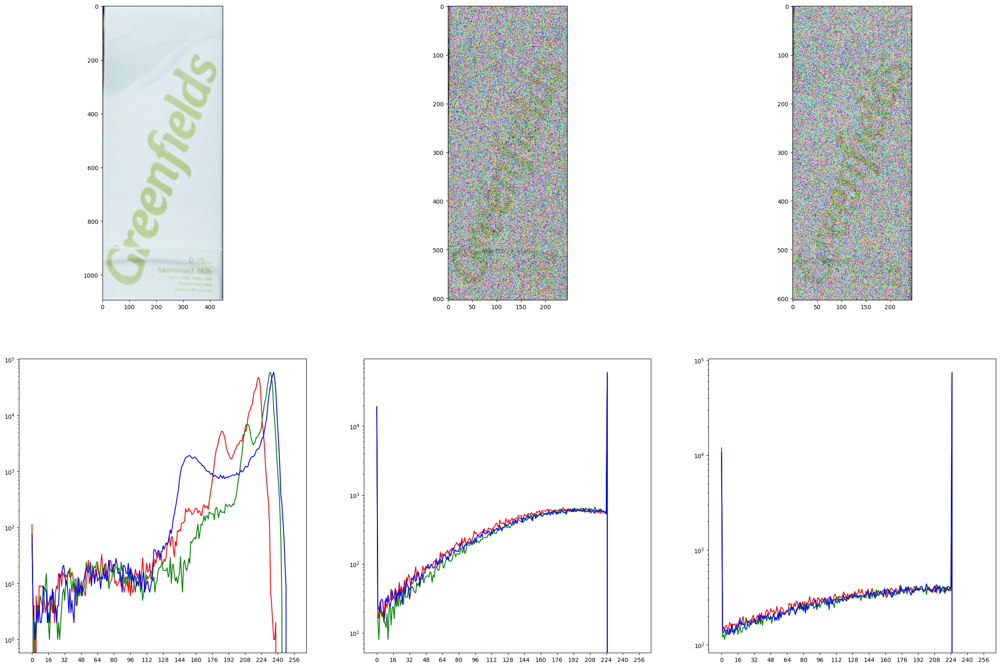

In [8]:
img_no_noise=cv2.imread(f'/Users/pelle/Desktop/dataset/models/ref{18}.png')[:,:,::-1]
img_scene=cv2.imread(f'/Users/pelle/Desktop/dataset/scenes/scene{12}.png')[100:,1085:1330,::-1]
img_noise=cv2.imread(f'/Users/pelle/Desktop/dataset/models/ref{18}.png')[:,:,::-1]
img_noise=cv2.resize(img_noise,(img_scene.shape[1],img_scene.shape[0]),interpolation= cv2.INTER_LINEAR)
noise = np.random.normal(scale=150, size=img_noise.shape)
img_noise=np.clip(img_noise-noise,0,225).astype(np.uint8)
print(np.abs(np.mean(img_scene)-np.mean(img_no_noise)),np.abs(np.mean(img_scene)-np.mean(img_noise)))
plot_rgb_distribution([img_no_noise]+
                        [img_scene]+
                        [img_noise]
                      )

In [9]:
# Per aggiungere il rumore e capire che rumore c'era originariamente
def add_noise_to_image(image, noise_type, parameters:dict):
    match noise_type:
        case "random" :
            '''
            parameter example
            {
                "intensity" : 20,
            }
            '''
            noise = np.random.normal(scale=parameters['intensity'], size=image.shape)
            noisy_image = np.clip(image - noise, 0, 225).astype(np.uint8)
            return noisy_image
        
        case _: ValueError("Unsupported noise type")
    return noisy_image

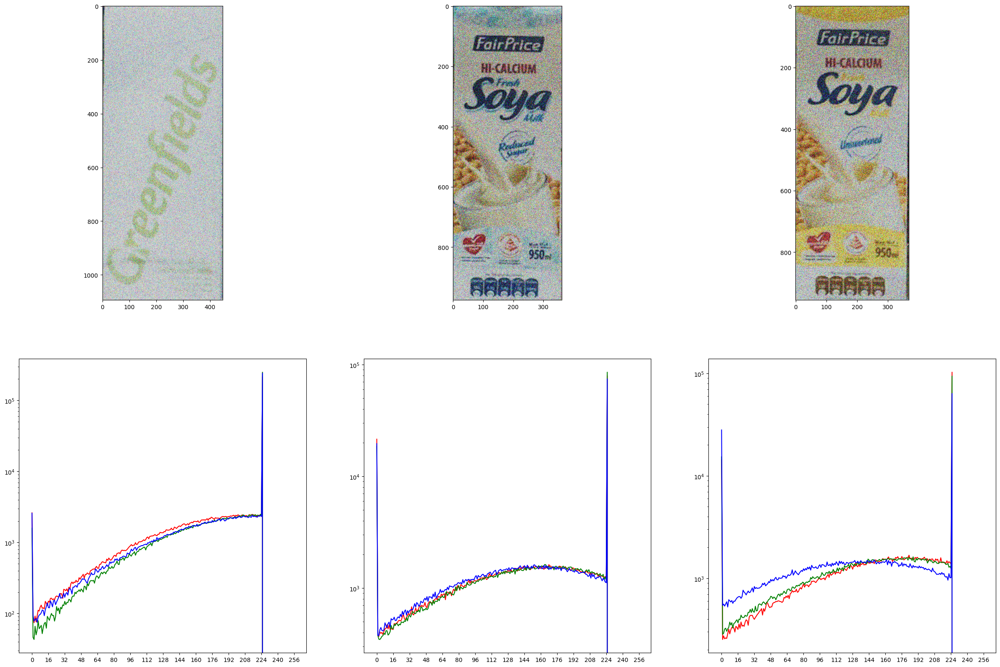

In [10]:
plot_rgb_distribution([
    add_noise_to_image(
        noise_type='random',
        image=cv2.imread(f'/Users/pelle/Desktop/dataset/models/ref{n}.png')[:,:,::-1], 
        parameters={"intensity":80}
    )
    for n in [18, 23, 24]
])

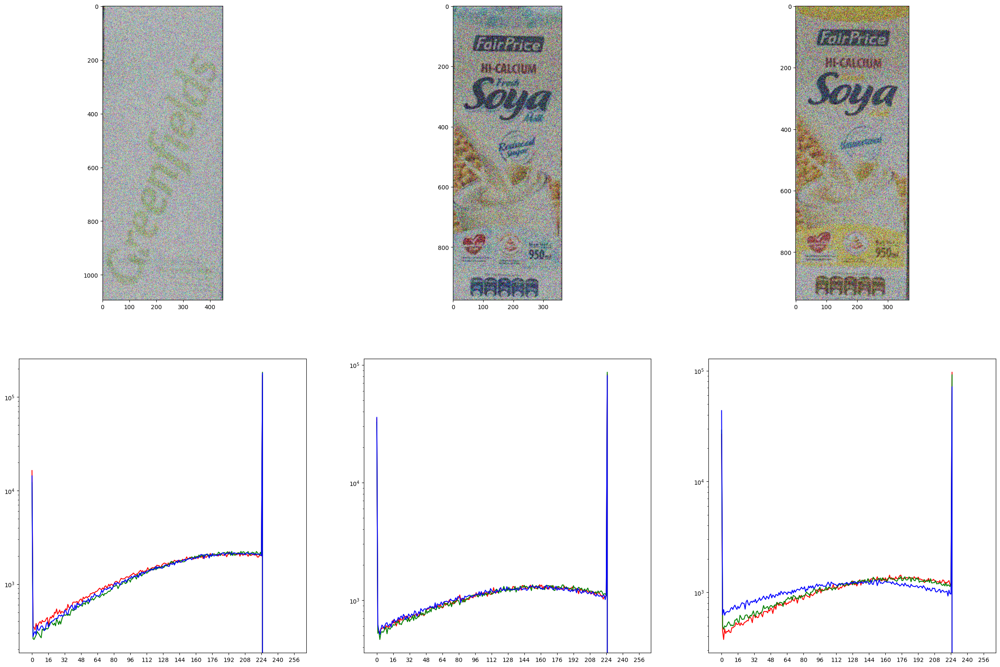

In [11]:
# Tentativo di aggiungere un noise che prima era stato tolto per provare a fare denoise
intensity = {"intensity":80}
plot_rgb_distribution([
        np.clip(
            add_noise_to_image(
                noise_type='random',
                image=cv2.imread(f'/Users/pelle/Desktop/dataset/models/ref{n}.png')[:,:,::-1], 
                parameters=intensity
            ) 
            + 
            np.random.normal(
                scale=intensity['intensity'], 
                size=cv2.imread(f'/Users/pelle/Desktop/dataset/models/ref{n}.png')[:,:,::-1].shape
            ), 
        0, 225).astype(np.uint8) 
    for n in [18, 23, 24]
])

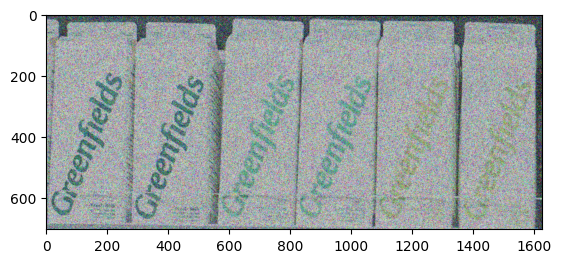

In [12]:
import cv2

def denoise_image(image):
    # Applica il filtro bilaterale per il denoising
    denoised_image = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)
    return denoised_image

# Utilizza l'immagine rumorosa come input
# noisy_image = add_noise_to_image(cv2.imread(f'/Users/pelle/Desktop/scene12.png')[:,:,::-1], 
#                                  "random", 
#                                  {"intensity": 80})
# Applica il denoising all'immagine rumorosa
denoised_image = denoise_image(cv2.imread(f'/Users/pelle/Desktop/dataset/scenes/scene12.png')[:,:,::-1])

# Mostra l'immagine originale, l'immagine rumorosa e l'immagine denoised
plt.imshow(denoised_image); plt.show()

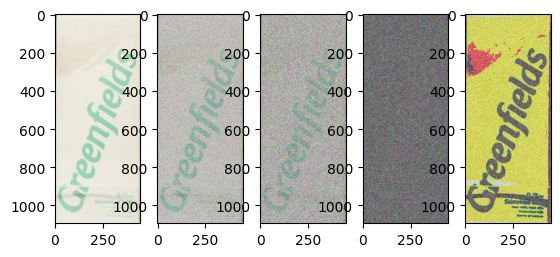

In [13]:
import numpy as np

def recover_original_image(noisy_image, noise_parameters):
    # Estrai il rumore aggiunto
    noise = np.random.normal(scale=noise_parameters['intensity'], size=noisy_image.shape)
    
    # Rimuovi il rumore dall'immagine rumorosa per recuperare l'immagine originale
    original_image = np.clip(noisy_image + noise, 0, 255).astype(np.uint8)
    
    return original_image

image = cv2.imread("/Users/pelle/Desktop/dataset/models/ref18.png")

# Utilizza l'immagine rumorosa come input
noisy_image = add_noise_to_image(image, "random", {"intensity": 100})

# Recupera un'approssimazione dell'immagine originale
recovered_image = recover_original_image(noisy_image, {"intensity": 100})

# Mostra l'immagine originale, l'immagine rumorosa e l'immagine recuperata
plt.subplot(151); plt.imshow(image)
plt.subplot(152); plt.imshow(noisy_image)
plt.subplot(153); plt.imshow(recovered_image)

plt.subplot(154); plt.imshow(recovered_image - noisy_image)
plt.subplot(155); plt.imshow(noisy_image - image)



In [ ]:
# import cv2
# import numpy as np
# import statsmodels.api as sm

# # Read the image
# image = cv2.imread('/Users/pelle/Desktop/dataset/scenes/scene12.png')

# # Extract RGB channels
# red_channel = image[:,:,0]
# green_channel = image[:,:,1]
# blue_channel = image[:,:,2]

# # Apply LOWESS smoothing to each channel
# smoothed_red = sm.nonparametric.lowess(red_channel.flatten(), np.arange(len(red_channel.flatten()))); print("Red fatto")
# smoothed_green = sm.nonparametric.lowess(green_channel.flatten(), np.arange(len(green_channel.flatten()))); print("Green fatto")
# smoothed_blue = sm.nonparametric.lowess(blue_channel.flatten(), np.arange(len(blue_channel.flatten()))); print("Blue fatto")

# # Reshape the smoothed values to match the original shape
# smoothed_red = np.reshape(smoothed_red[:, 1], red_channel.shape)
# smoothed_green = np.reshape(smoothed_green[:, 1], green_channel.shape)
# smoothed_blue = np.reshape(smoothed_blue[:, 1], blue_channel.shape)

# # Combine smoothed channels to form the smoothed RGB image
# smoothed_image = np.stack((smoothed_red, smoothed_green, smoothed_blue), axis=-1)

# # Convert float values to uint8
# smoothed_image = np.uint8(smoothed_image)

# # Display or save the smoothed image
# plt.imshow(smoothed_image)

In [58]:
def fastNlMeansDenoisingRGB(image, h=10, templateWindowSize=7, searchWindowSize=21):
    # Split the image into RGB channels
    b, g, r = cv2.split(noisy_image)

    # Apply non-local means denoising to each channel
    b_denoised = cv2.fastNlMeansDenoising(b, None, h=h, templateWindowSize=templateWindowSize, searchWindowSize=searchWindowSize)
    g_denoised = cv2.fastNlMeansDenoising(g, None, h=h, templateWindowSize=templateWindowSize, searchWindowSize=searchWindowSize)
    r_denoised = cv2.fastNlMeansDenoising(r, None, h=h, templateWindowSize=templateWindowSize, searchWindowSize=searchWindowSize)

    # Merge the denoised channels back into an RGB image
    denoised_image = cv2.merge((b_denoised, g_denoised, r_denoised))
    
    return denoise_image

In [60]:
import cv2
import numpy as np
from skimage.restoration import denoise_wavelet

# Read the noisy image
noisy_images = [cv2.imread(f'/Users/pelle/Desktop/dataset/scenes/scene{n}.png')[:,:,::-1] for n in range(6,13)]

for noisy_image in noisy_images:
    ## Apply denoise ##
    # denoised_image = cv2.GaussianBlur(noisy_image, (5, 5), 0)
    # denoised_image = fastNlMeansDenoisingRGB(noisy_image, h=10, templateWindowSize=7, searchWindowSize=21)
    # denoised_image = cv2.bilateralFilter(noisy_image, d=9, sigmaColor=75, sigmaSpace=75)
    denoised_image = denoise_wavelet(noisy_image)   # TODO : capire come usarlo           # FIXME : da errore strano
    # denoised_image = cv2.denoise_TVL1(noisy_image, None, lambda_=0.01)
    # denoised_image = cv2.medianBlur(noisy_image, 5)
    
    # Convert BGR to RGB
    noisy_image_rgb = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB)
    denoised_image_rgb = cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB)

    # Display the original and denoised images
    plt.subplot(121); plt.imshow(noisy_image)
    plt.subplot(122); plt.imshow(denoised_image)
    plt.show()


error: OpenCV(4.9.0) /Users/runner/work/opencv-python/opencv-python/opencv/modules/imgproc/src/color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function 'cv::impl::(anonymous namespace)::CvtHelper<cv::impl::(anonymous namespace)::Set<3, 4, -1>, cv::impl::(anonymous namespace)::Set<3, 4, -1>, cv::impl::(anonymous namespace)::Set<0, 2, 5>, cv::impl::(anonymous namespace)::NONE>::CvtHelper(cv::InputArray, cv::OutputArray, int) [VScn = cv::impl::(anonymous namespace)::Set<3, 4, -1>, VDcn = cv::impl::(anonymous namespace)::Set<3, 4, -1>, VDepth = cv::impl::(anonymous namespace)::Set<0, 2, 5>, sizePolicy = cv::impl::(anonymous namespace)::NONE]'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 6 (CV_64F)
